In [27]:
!pip install pymongo
!pip install faker
!pip install unidecode
!pip install pandas
!pip install openpyxl
!pip install apyori
!pip install ipywidgets
!pip install prophet

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
  Using cached prophet-1.1.5-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.5 kB)
  Using cached cmdstanpy-1.2.2-py3-none-any.whl.metadata (4.1 kB)
  Using cached holidays-0.48-py3-none-any.whl.metadata (23 kB)
  Using cached tqdm-4.66.4-py3-none-any.whl.metadata (57 kB)
  Using cached importlib_resources-6.4.0-py3-none-any.whl.metadata (3.9 kB)
  Using

In [1]:
from faker import Faker
from pymongo import MongoClient
from datetime import datetime
import pandas as pd
import random

### Faker será usado para criar valores fictícios

In [2]:
fake = Faker('pt_BR')

### MongoDB

In [3]:
uri = 'mongodb://localhost/'
db = MongoClient(uri)['vendas']

# a quantidade de usuários define também a quantidade representantes
QUANTIDADE_USUARIOS = 10

# Criar usuários que serão usados como representantes

## executar usando shell !!!
    "python manage.py shell"

e depois colar o resultado abaixo

In [11]:
from unidecode import unidecode

print('from django.contrib.auth.models import User')

for i in range(QUANTIDADE_USUARIOS):
  first_name = fake.first_name()
  last_name = fake.last_name()
  username = unidecode(first_name.split()[0].lower()) + '.'
  username += unidecode(last_name.split()[-1].lower())
  email = username + '@example.com'
  print(f"User.objects.create_user(username='{username}', email='{email}', password='123', is_staff=True, first_name='{first_name}', last_name='{last_name}', )")
print()

from django.contrib.auth.models import User
User.objects.create_user(username = 'vitoria.mata', email = 'vitoria.mata@example.com', password = '123', is_staff = True, first_name = 'Vitória', last_name = 'da Mata', )
User.objects.create_user(username = 'agatha.mota', email = 'agatha.mota@example.com', password = '123', is_staff = True, first_name = 'Agatha', last_name = 'da Mota', )
User.objects.create_user(username = 'agatha.souza', email = 'agatha.souza@example.com', password = '123', is_staff = True, first_name = 'Agatha', last_name = 'Souza', )
User.objects.create_user(username = 'lavinia.freitas', email = 'lavinia.freitas@example.com', password = '123', is_staff = True, first_name = 'Lavínia', last_name = 'Freitas', )
User.objects.create_user(username = 'larissa.luz', email = 'larissa.luz@example.com', password = '123', is_staff = True, first_name = 'Larissa', last_name = 'da Luz', )
User.objects.create_user(username = 'otavio.carvalho', email = 'otavio.carvalho@example.com', passw

# Criar representantes e clientes
necessita de usuários cadastrados

In [12]:
representantes = []
for user in db['auth_user'].find({ 'id': { '$gt': 1 }}):
  clientes = []
  for i in range(random.randrange(1, 6)):
    clientes.append({
      'id': i + 1,
      'nome': f'{fake.company().upper()} {fake.company_suffix().upper()}',
      'cnpj': fake.cnpj(),
      'contato': fake.name(),
      'telefone': fake.cellphone_number(),
      'email': fake.email(),
      'endereco': {
        'logradouro': fake.street_address(),
        'bairro': fake.bairro(),
        'cidade': fake.city(),
        'estado': fake.estado_sigla(),
        'cep': fake.postcode(formatted=True),
      }
    })
  representantes.append({
    'id': user['id'],
    'nome': f"{user['first_name']} {user['last_name']}",
    'cpf': fake.cpf(),
    'nivel': 'CONFIRMAR',
    'user_id': user['id'],
    'clientes': clientes,
  })
representantes

[{'id': 2,
  'nome': 'Vitória da Mata',
  'cpf': '086.925.743-92',
  'nivel': 'CONFIRMAR',
  'user_id': 2,
  'clientes': [{'id': 1,
    'nome': 'MOURA S/A',
    'cnpj': '29.468.031/0001-53',
    'contato': 'Vitor Hugo Barbosa',
    'telefone': '+55 (079) 91711-6597',
    'email': 'catarina97@example.net',
    'endereco': {'logradouro': 'Colônia Nunes, 3',
     'bairro': 'Candelaria',
     'cidade': 'Souza',
     'estado': 'CE',
     'cep': '13642-215'}},
   {'id': 2,
    'nome': 'DA ROCHA S.A.',
    'cnpj': '85.731.240/0001-19',
    'contato': 'Sophie Sales',
    'telefone': '+55 91 98153 8215',
    'email': 'erodrigues@example.org',
    'endereco': {'logradouro': 'Conjunto de Pires',
     'bairro': 'Boa União 1ª Seção',
     'cidade': 'Porto da Mata',
     'estado': 'SE',
     'cep': '70639660'}},
   {'id': 3,
    'nome': 'DA CONCEIÇÃO PINTO E FILHOS - EI',
    'cnpj': '70.359.814/0001-00',
    'contato': 'Gabrielly Campos',
    'telefone': '+55 (52) 9 3700 3137',
    'email': 'costel

In [ ]:
db['venda_representante'].delete_many({})
db['venda_representante'].insert_many(representantes)

### estoque

In [37]:
xls = pd.read_excel('estoque.xlsx')

In [38]:
estoques = []
for i, e in enumerate(xls.to_dict('records')):
  estoques.append({
    'id': i + 1,
    'produto': {
      'marca': {
        'nome': e['marca'],
      },
      'categoria': {
        'titulo': e['categoria'],
      },
      'descricao': e['descricao'],
    },
    'quantidade': e['quantidade'],
    'preco_compra': e['preco_compra'],
    'preco_venda': e['preco_compra'] * 2,
  })
estoques

[{'id': 1,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Leiteira Texas Media 550ml'},
  'quantidade': 1000,
  'preco_compra': 14.925,
  'preco_venda': 29.85,
  '_id': ObjectId('66399227489da24ed18e99c7')},
 {'id': 2,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Xicara Café c/ pires Veneza'},
  'quantidade': 1000,
  'preco_compra': 7.345,
  'preco_venda': 14.69,
  '_id': ObjectId('66399227489da24ed18e99c8')},
 {'id': 3,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'titulo': 'Biscoitos, Bolos e Torradas em Sache'},
   'descricao': 'Sache Biscoito AMANTEIGADO COCO RENATA SACHÊ 9G 2X2 CAIXA 280 und'},
  'quantidade': 1000,
  'preco_compra': 43.935,
  'preco_venda': 87.87,
  '_id': ObjectId('66399227489da24ed18e99c9')},
 {'id': 4,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'titulo': 'Biscoitos, Bolos e Torradas em Sache'},
   'descricao': 'Sache de Bi

In [ ]:
db['venda_estoque'].delete_many({})
db['venda_estoque'].insert_many(estoques)

# Pedidos

### base original

In [6]:
df_ori = pd.read_csv('Sales_Product_Combined.csv')
df_ori

,Order ID,Product,Quantity Ordered,Price,Order Date,Time,Purchase Address,City,Product Type
0,176558,USB-C Charging Cable,2,11.95,19-04-2019,8:46 AM,"917 1st St, Dallas, TX 75001",Dallas,Cable
1,176559,Bose SoundSport Headphones,1,99.99,07-04-2019,10:30 PM,"682 Chestnut St, Boston, MA 02215",Boston,Headphones
2,176560,Google Phone,1,600,12-04-2019,2:38 PM,"669 Spruce St, Los Angeles, CA 90001",Los Angeles,Phone
3,176560,Wired Headphones,1,11.99,12-04-2019,2:38 PM,"669 Spruce St, Los Angeles, CA 90001",Los Angeles,Headphones
4,176561,Wired Headphones,1,11.99,30-04-2019,9:27 AM,"333 8th St, Los Angeles, CA 90001",Los Angeles,Headphones
...,...,...,...,...,...,...,...,...,...
185945,259353,AAA Batteries (4-pack),3,2.99,17-09-2019,8:56 PM,"840 Highland St, Los Angeles, CA 90001",Los Angeles,Batteries
185946,259354,iPhone,1,700,01-09-2019,4:00 PM,"216 Dogwood St, San Francisco, CA 94016",San Francisco,iPhone
185947,259355,iPhone,1,700,23-09-2019,7:39 AM,"220 12th St, San Francisco, CA 94016",San Francisco,iPhone
185948,259356,34in Ultrawide Monitor,1,379.99,19-09-2019,5:30 PM,"511 Forest St, San Francisco, CA 94016",San Francisco,Monitor


In [7]:
# quantidade por cidade
df_ori.groupby('City')['Quantity Ordered'].count().sort_values()

City
Austin            9905
Portland         12465
Seattle          14732
Dallas           14820
Atlanta          14881
Boston           19934
New York City    24876
Los Angeles      29605
San Francisco    44732
Name: Quantity Ordered, dtype: int64

### quantidades: Austin=9905, Boston=19934, San Francisco=44732

In [97]:
# renomeando campos
df_aux = df_ori.rename(columns={
  'Order ID': 'id', 
  'Product' : 'produto', 
  'Quantity Ordered': 'quantidade', 
  'Price': 'preco', 
  'Order Date': 'data',
  'Time': 'hora',
  'Product Type': 'categoria', 
  'Purchase Address': 'endereco', 
  'City': 'cidade',
})

# criando campo horário
df_aux['horario'] = pd.to_datetime(df_aux['data'] + ' ' + df_aux['hora'], format='%d-%m-%Y %I:%M %p')

# diminuindo quantidade de registros
df_aux['cidade'] = df_aux['cidade'].str.strip()
# df_aux = df_aux.query('horario.dt.year == 2019 and cidade == "San Francisco"')[
df_aux = df_aux.query('horario.dt.year == 2019 and cidade == "Atlanta"')[
  ['horario', 'produto', 'quantidade', 'preco']
]

### ajustando os valores

In [98]:
df = df_aux.sort_values('horario')

# campo auxiliar para aleatórios
df['rnd'] = [random.randrange(100) for _ in df.index]

# transferir 25% das vendas dos meses 3, 4 e 5 para os meses 9, 10 e 11
df['horario'] = df['horario'].mask(
  (df['horario'] > pd.to_datetime('01-03-2019', format='%d-%m-%Y')) & 
  (df['horario'] < pd.to_datetime('01-06-2019', format='%d-%m-%Y')) & 
  (df['rnd'] < 25), 
  df['horario'] + pd.DateOffset(months=6))

# transferir 20% das vendas do mês 12 para o mês 1
df['horario'] = df['horario'].mask(
  (df['horario'] > pd.to_datetime('01-12-2019', format='%d-%m-%Y')) & 
  (df['rnd'] < 20), 
  df['horario'] + pd.DateOffset(months=-11))

# distribuir aleatóriamente os registros em 5 anos
df['rnd'] = [random.randrange(100) for _ in df.index]
df['horario'] = df['horario'].mask(
  (df.rnd < 25), 
  df['horario'] + pd.DateOffset(years=2))
df['horario'] = df['horario'].mask(
  (df.rnd >= 25) & 
  (df.rnd < 50),
  df['horario'] + pd.DateOffset(years=3))
df['horario'] = df['horario'].mask(
  (df.rnd >= 50) & 
  (df.rnd < 75),
  df['horario'] + pd.DateOffset(years=4))
df['horario'] = df['horario'].mask(
  (df.rnd >= 75),
  df['horario'] + pd.DateOffset(years=5))

# campo auxiliar de data
df['data'] = pd.to_datetime(df['horario']).dt.date

# distribuir os itens do pedido
df['nota'] = df['horario'].dt.strftime('%Y%m%d-%M').str.slice(stop=10)

# permitir cálculo com o preço
df['preco'] = df['preco'].str.replace(',', '').astype(float)
df['preco'] = df.apply(lambda row: row['preco'] * 10 if row['preco'] < 80 else row['preco'], axis=1)
df['preco'] = df['preco'].round(2)

# calcular aleatóriamente quantidade, mas valores menores tem peso maior
pop = [i + 1 for i in range(40)]
wei = [i * i + 1 for i in range(40, 0, -1)]
df['quantidade'] = random.choices(pop, wei, k=len(df.index))
df['quantidade'] = (df['quantidade'] / (df['quantidade'] * df['preco'] / 10000 + 1).astype(int)).astype(int)
df['total'] = df['quantidade'] * df['preco']
df['total'] = df['total'].round(2)

# renomear produtos
prod = {
  'AA Batteries (4-pack)': 'P01',
  'AAA Batteries (4-pack)': 'P02',
  'Lightning Charging Cable': 'P03',
  'USB-C Charging Cable': 'P04',
  'LG Dryer': 'P05',
  'Apple Airpods Headphones': 'P06',
  'Bose SoundSport Headphones': 'P07',
  'Wired Headphones': 'P08',
  'iPhone': 'P09',
  'Macbook Pro Laptop': 'P10',
  'ThinkPad Laptop': 'P11',
  'LG Washing Machine': 'P12',
  '20in Monitor': 'P13',
  '27in 4K Gaming Monitor': 'P14',
  '27in FHD Monitor': 'P15',
  '34in Ultrawide Monitor': 'P16',
  'Google Phone': 'P17',
  'Vareebadd Phone': 'P18',
  'Flatscreen TV': 'P19',
}
df['produto'] = df.apply(lambda row: prod[row['produto']], axis=1)

df = df[['nota', 'data', 'horario', 'produto', 'quantidade']].sort_values('horario')
df

,nota,data,horario,produto,quantidade
38565,20210101-4,2021-01-01,2021-01-01 10:44:00,P04,15
74381,20210101-2,2021-01-01,2021-01-01 11:25:00,P04,2
71023,20210101-2,2021-01-01,2021-01-01 14:29:00,P13,12
67645,20210101-3,2021-01-01,2021-01-01 14:36:00,P13,23
30439,20210101-2,2021-01-01,2021-01-01 15:29:00,P08,19
...,...,...,...,...,...
38051,20241231-4,2024-12-31,2024-12-31 19:40:00,P03,20
44817,20241231-0,2024-12-31,2024-12-31 20:08:00,P01,7
42238,20241231-3,2024-12-31,2024-12-31 20:39:00,P03,5
31436,20241231-4,2024-12-31,2024-12-31 20:49:00,P01,4


In [99]:
# df.head()
# df.info()
# df[:20]
# df[-20:]
df.shape
# df_aux.shape
# df_aux[:20]
# df_aux[-20:]

(14881, 5)

In [100]:
# quantidade por mês
j = df[['horario', 'quantidade']]
j.index = df.horario
j.resample(rule='ME', on='horario')['quantidade'].sum()

horario
2021-01-31    2831
2021-02-28    2270
2021-03-31    2175
2021-04-30    2715
2021-05-31    2228
2021-06-30    2723
2021-07-31    2686
2021-08-31    2517
2021-09-30    3077
2021-10-31    5000
2021-11-30    4395
2021-12-31    4515
2022-01-31    3414
2022-02-28    2398
2022-03-31    2251
2022-04-30    2751
2022-05-31    2497
2022-06-30    2597
2022-07-31    2998
2022-08-31    2286
2022-09-30    3110
2022-10-31    4996
2022-11-30    4580
2022-12-31    3758
2023-01-31    2426
2023-02-28    2165
2023-03-31    2681
2023-04-30    3012
2023-05-31    2742
2023-06-30    2602
2023-07-31    2889
2023-08-31    2509
2023-09-30    3081
2023-10-31    5084
2023-11-30    3961
2023-12-31    3967
2024-01-31    3019
2024-02-29    2101
2024-03-31    2374
2024-04-30    2861
2024-05-31    2289
2024-06-30    3246
2024-07-31    2770
2024-08-31    2342
2024-09-30    3049
2024-10-31    4761
2024-11-30    4532
2024-12-31    4288
Freq: ME, Name: quantidade, dtype: int64

In [101]:
q = f'horario < "{datetime.now().date()}"'
df_ins = df.query(q).sort_values(['data', 'nota', 'produto'])

In [102]:
df_ins[:30]
# df_ins[-30:]

,nota,data,horario,produto,quantidade
74381,20210101-2,2021-01-01,2021-01-01 11:25:00,P04,2
30439,20210101-2,2021-01-01,2021-01-01 15:29:00,P08,19
71023,20210101-2,2021-01-01,2021-01-01 14:29:00,P13,12
67645,20210101-3,2021-01-01,2021-01-01 14:36:00,P13,23
38565,20210101-4,2021-01-01,2021-01-01 10:44:00,P04,15
74761,20210101-4,2021-01-01,2021-01-01 22:46:00,P08,20
52664,20210101-4,2021-01-01,2021-01-01 21:42:00,P10,5
71292,20210101-4,2021-01-01,2021-01-01 16:44:00,P16,12
43931,20210101-5,2021-01-01,2021-01-01 15:55:00,P06,16
68323,20210101-5,2021-01-01,2021-01-01 20:54:00,P06,8


In [103]:
df_ins.shape

(12238, 5)

# Preparar e Inserir Pedidos

In [104]:
representantes = list(db['venda_representante'].find())

estoques = {}
for e in db['venda_estoque'].find():
  estoques[f"P{e['id']:02}"] = e

In [105]:
estoques

{'P01': {'_id': ObjectId('66399227489da24ed18e99c7'),
  'id': 1,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Leiteira Texas Media 550ml'},
  'quantidade': 1000,
  'preco_compra': 14.925,
  'preco_venda': 29.85},
 'P02': {'_id': ObjectId('66399227489da24ed18e99c8'),
  'id': 2,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Xicara Café c/ pires Veneza'},
  'quantidade': 1000,
  'preco_compra': 7.345,
  'preco_venda': 14.69},
 'P03': {'_id': ObjectId('66399227489da24ed18e99c9'),
  'id': 3,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'titulo': 'Biscoitos, Bolos e Torradas em Sache'},
   'descricao': 'Sache Biscoito AMANTEIGADO COCO RENATA SACHÊ 9G 2X2 CAIXA 280 und'},
  'quantidade': 1000,
  'preco_compra': 43.935,
  'preco_venda': 87.87},
 'P04': {'_id': ObjectId('66399227489da24ed18e99ca'),
  'id': 4,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'tit

In [106]:
def gen_pedido(i, itens_pedido, total, representantes, horario):
  representante = random.choice(representantes)
  cliente = random.choice(representante['clientes'])

  etapas = [{
    'id': 1,
    'etapa': 'criado',
    'horario': horario,
    'user_id': representante['id']
  }]
  etapa_id = 2
  if representante['id'] != 2:
    etapas.append({
      'id': etapa_id,
      'etapa': 'enviado',
      'horario': horario,
      'user_id': representante['id']
    })
    etapa_id += 1
  etapas.append({
    'id': etapa_id,
    'etapa': 'confirmado',
    'horario': horario,
    'user_id': 2
  })

  pedido = {
    'id': i,
    'etapa': 'confirmado',
    'etapas_pedido': etapas,
    'representante_id': representante['id'],
    'cliente': cliente,
    'horario': horario,
    'itens_pedido': itens_pedido,
    'total': round(total, 2)
  }

  return pedido


In [107]:
pedidos = []
itens_pedido = []
i = 0
nota = df_ins.iloc[0, 0]
horario = df_ins.iloc[0, 2]
prod_ant = ''
total = 0
for e in df_ins.itertuples():
  if nota != e.nota:
    i += 1
    pedido = gen_pedido(i, itens_pedido, total, representantes, horario)
    pedidos.append(pedido)
    itens_pedido = []
    prod_ant = ''
    total = 0
    nota = e.nota
    horario  = e.horario

  estoque = estoques[e.produto]
  total_prod = round(e.quantidade * estoque['preco_venda'], 2)
  total += total_prod
  if e.produto == prod_ant:
    itens_pedido[-1]['quantidade'] += e.quantidade
  else:
    item = {
      'id': estoque['id'],
      'produto': estoque['produto'],
      'preco_compra': estoque['preco_compra'],
      'preco_venda': estoque['preco_venda'],
      'quantidade': e.quantidade,
      'total': total_prod
    }
    itens_pedido.append(item)
    prod_ant = e.produto

if nota != df_ins.iloc[0, 0]:
  pedido = gen_pedido(i + 1, itens_pedido, total, representantes, horario)
  pedidos.append(pedido)

In [108]:
from pprint import pprint
pprint(pedidos)

[{'cliente': {'cnpj': '20.547.693/0001-44',
              'contato': 'Dra. Maria Melo',
              'email': 'rodriguesthales@example.org',
              'endereco': {'bairro': 'Savassi',
                           'cep': '89976069',
                           'cidade': 'Souza de Fogaça',
                           'estado': 'MS',
                           'logradouro': 'Núcleo Vieira, 748'},
              'id': 1,
              'nome': 'GOMES - ME S/A',
              'telefone': '+55 94 96474 1938'},
  'etapa': 'confirmado',
  'etapas_pedido': [{'etapa': 'criado',
                     'horario': Timestamp('2021-01-01 11:25:00'),
                     'id': 1,
                     'user_id': 6},
                    {'etapa': 'enviado',
                     'horario': Timestamp('2021-01-01 11:25:00'),
                     'id': 2,
                     'user_id': 6},
                    {'etapa': 'confirmado',
                     'horario': Timestamp('2021-01-01 11:25:00'),
          

In [109]:
db['venda_pedido'].delete_many({})
db['venda_pedido'].insert_many(pedidos)

InsertManyResult([ObjectId('6641107bb184f0223df226c6'), ObjectId('6641107bb184f0223df226c7'), ObjectId('6641107bb184f0223df226c8'), ObjectId('6641107bb184f0223df226c9'), ObjectId('6641107bb184f0223df226ca'), ObjectId('6641107bb184f0223df226cb'), ObjectId('6641107bb184f0223df226cc'), ObjectId('6641107bb184f0223df226cd'), ObjectId('6641107bb184f0223df226ce'), ObjectId('6641107bb184f0223df226cf'), ObjectId('6641107bb184f0223df226d0'), ObjectId('6641107bb184f0223df226d1'), ObjectId('6641107bb184f0223df226d2'), ObjectId('6641107bb184f0223df226d3'), ObjectId('6641107bb184f0223df226d4'), ObjectId('6641107bb184f0223df226d5'), ObjectId('6641107bb184f0223df226d6'), ObjectId('6641107bb184f0223df226d7'), ObjectId('6641107bb184f0223df226d8'), ObjectId('6641107bb184f0223df226d9'), ObjectId('6641107bb184f0223df226da'), ObjectId('6641107bb184f0223df226db'), ObjectId('6641107bb184f0223df226dc'), ObjectId('6641107bb184f0223df226dd'), ObjectId('6641107bb184f0223df226de'), ObjectId('6641107bb184f0223df226

In [110]:
# atualizando controle do sequencial de pedidos
print(db['__schema__'].find_one({'name': 'venda_pedido'})['auto']['seq'])
print(len(pedidos))

db['__schema__'].update_one({'name': 'venda_pedido'}, {
  '$set': {
    'auto.seq': len(pedidos)
  }}, upsert=False)

print(db['__schema__'].find_one({'name': 'venda_pedido'}))

4885
5887
{'_id': ObjectId('6636a5166034bd29b7dcf81f'), 'name': 'venda_pedido', 'auto': {'field_names': ['id'], 'seq': 5887}, 'fields': {'cliente': {'type_code': 'object'}, 'etapa': {'type_code': 'string'}, 'etapas_pedido': {'type_code': 'array'}, 'horario': {'type_code': 'date'}, 'id': {'type_code': 'int'}, 'itens_pedido': {'type_code': 'array'}, 'representante_id': {'type_code': 'int'}, 'total': {'type_code': 'double'}}}


# Recomendação de produtos - Algoritmos Apriori

In [111]:
# dados de 1 ano
d = datetime.now()
db['venda_pedido'].count_documents({'horario':  {'$gte': datetime(d.year - 1, d.month, d.day)}})
db['venda_pedido'].find({'horario':  {'$gte': datetime(d.year - 1, d.month, d.day)}}).limit(10)

In [112]:
# dados de 1 ano
d = datetime.now()
cur = db['venda_pedido'].find({'horario':  {'$gte': datetime(d.year - 1, d.month, d.day)}})

pedi = []
for ped in cur:
  itens = []
  for prod in ped['itens_pedido']:
    id = prod['id']
    while len(itens) < id - 1: itens.append(' - ')
    itens.append(f'P{id:02}')
  while len(itens) < 20: itens.append(' - ')
  pedi.append(itens)

In [113]:
# visualizar
for a in pedi:
  print(a)

[' - ', 'P02', ' - ', 'P04', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P08', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P09', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', 'P03', ' - ', ' - ', ' - ', ' - ', 'P08', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', 'P04', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', 'P04', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', 'P04', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
['P01', ' - '

In [114]:
from apyori import apriori
# regras = list(apriori(pedi, min_support = 0.0006, min_confidence = 0.3, min_lift = 1))
# regras = list(apriori(pedi, min_support = 0.001, min_confidence = 0.1, min_lift = 1))
regras = list(apriori(pedi, min_support = 0.0007, min_confidence = 0.1, min_lift = 1))
# regras = list(apriori(pedi, min_support = 0.0001, min_confidence = 0, min_lift = 0))
# regras = list(apriori(pedi, min_support = 0.00069, min_confidence = 0, min_lift = 0))

it_a = []
it_b = []
# rule = []
supo = []
conf = []
lift = []
for regra in regras:
  for item in regra[2]:
    if ' - ' not in item[0] and ' - ' not in item[1]:
      # rule.append(f"{', '.join(item[0])} > {', '.join(item[1])}")
      it_a.append(','.join(sorted(item[0])))
      it_b.append(','.join(sorted(item[1])))
      supo.append(regra[1])
      conf.append(item[2])
      lift.append(item[3])

df_apriori = pd.DataFrame({
  'item_a': it_a, 
  'item_b': it_b, 
  # 'regra': rule, 
  'suporte': supo, 
  'confianca': conf, 
  'lift': lift
}).sort_values(
  by = ['lift', 'confianca', 'suporte'], 
  ascending = False).reset_index()
df_apriori


,index,item_a,item_b,suporte,confianca,lift
0,964,"P02,P03,P16","P07,P19",0.001140,0.500000,41.761905
1,945,"P02,P03,P08","P07,P18",0.001140,0.200000,38.977778
2,942,"P07,P18","P02,P03,P08",0.001140,0.222222,38.977778
3,965,"P02,P03,P19","P07,P16",0.001140,0.285714,38.549451
4,961,"P07,P16","P02,P03,P19",0.001140,0.153846,38.549451
...,...,...,...,...,...,...
973,0,,P01,0.205245,0.205245,1.000000
974,1,,P02,0.196123,0.196123,1.000000
975,6,,P08,0.180730,0.180730,1.000000
976,4,,P06,0.172178,0.172178,1.000000


In [69]:
i = 0
j = i + 60
df_apriori[i:j]

,index,item_a,item_b,suporte,confianca,lift
0,153,"P02,P14","P01,P07",0.001355,0.400000,22.707692
1,160,"P02,P16","P01,P07",0.001355,0.333333,18.923077
2,161,"P07,P16","P01,P02",0.001355,0.285714,14.541872
3,68,"P01,P11",P18,0.001355,0.285714,14.057143
4,69,"P01,P18",P11,0.001355,0.400000,11.353846
5,152,"P01,P14","P02,P07",0.001355,0.153846,11.353846
6,154,"P07,P14","P01,P02",0.001355,0.222222,11.310345
7,159,"P01,P16","P02,P07",0.001355,0.142857,10.542857
8,156,"P01,P02,P14",P07,0.001355,1.000000,8.945455
9,168,"P07,P14","P01,P03",0.001355,0.222222,8.864865


In [181]:
df_apriori.to_dict('records')

[{'index': 158,
  'item_a': 'P03,P19',
  'item_b': 'P02,P06',
  'suporte': 0.0013774104683195593,
  'confianca': 0.18181818181818182,
  'lift': 12.0},
 {'index': 185,
  'item_a': 'P04,P07,P08',
  'item_b': 'P15',
  'suporte': 0.0013774104683195593,
  'confianca': 0.6666666666666666,
  'lift': 10.189473684210526},
 {'index': 157,
  'item_a': 'P02,P19',
  'item_b': 'P03,P06',
  'suporte': 0.0013774104683195593,
  'confianca': 0.2222222222222222,
  'lift': 8.962962962962962},
 {'index': 160,
  'item_a': 'P02,P03,P06',
  'item_b': 'P19',
  'suporte': 0.0013774104683195593,
  'confianca': 0.4,
  'lift': 8.180281690140845},
 {'index': 184,
  'item_a': 'P08,P15',
  'item_b': 'P04,P07',
  'suporte': 0.0013774104683195593,
  'confianca': 0.15384615384615385,
  'lift': 6.980769230769231},
 {'index': 82,
  'item_a': 'P02,P17',
  'item_b': 'P10',
  'suporte': 0.0013774104683195593,
  'confianca': 0.25,
  'lift': 6.849056603773585},
 {'index': 182,
  'item_a': 'P04,P15',
  'item_b': 'P07,P08',
  's

In [115]:
db['venda_apriori'].delete_many({})
db['venda_apriori'].insert_many(df_apriori.to_dict('records'))

InsertManyResult([ObjectId('664110a4b184f0223df23dc5'), ObjectId('664110a4b184f0223df23dc6'), ObjectId('664110a4b184f0223df23dc7'), ObjectId('664110a4b184f0223df23dc8'), ObjectId('664110a4b184f0223df23dc9'), ObjectId('664110a4b184f0223df23dca'), ObjectId('664110a4b184f0223df23dcb'), ObjectId('664110a4b184f0223df23dcc'), ObjectId('664110a4b184f0223df23dcd'), ObjectId('664110a4b184f0223df23dce'), ObjectId('664110a4b184f0223df23dcf'), ObjectId('664110a4b184f0223df23dd0'), ObjectId('664110a4b184f0223df23dd1'), ObjectId('664110a4b184f0223df23dd2'), ObjectId('664110a4b184f0223df23dd3'), ObjectId('664110a4b184f0223df23dd4'), ObjectId('664110a4b184f0223df23dd5'), ObjectId('664110a4b184f0223df23dd6'), ObjectId('664110a4b184f0223df23dd7'), ObjectId('664110a4b184f0223df23dd8'), ObjectId('664110a4b184f0223df23dd9'), ObjectId('664110a4b184f0223df23dda'), ObjectId('664110a4b184f0223df23ddb'), ObjectId('664110a4b184f0223df23ddc'), ObjectId('664110a4b184f0223df23ddd'), ObjectId('664110a4b184f0223df23d

# Predição com Prophet

In [5]:
# # dados de 1 ano
# d = datetime.now()
# cur = db['venda_pedido'].find({'horario':  {'$gte': datetime(d.year - 1, d.month, d.day)}})
cur = db['venda_pedido'].find()

df_prophet = pd.DataFrame(cur)[['horario', 'total']].rename(columns={'horario': 'ds', 'total': 'y'}).sort_values(['ds'])
df_prophet

,ds,y
2,2021-01-01 10:44:00,16262.00
0,2021-01-01 11:25:00,2321.57
1,2021-01-01 14:36:00,2461.00
3,2021-01-01 15:55:00,5104.56
5,2021-01-02 06:10:00,9736.83
...,...,...
5879,2024-05-10 17:10:00,87.87
5880,2024-05-10 17:28:00,425.38
5884,2024-05-11 10:22:00,2568.00
5885,2024-05-11 10:45:00,1054.44


In [6]:
from prophet import Prophet

m = Prophet()
m.fit(df_prophet)

Importing plotly failed. Interactive plots will not work.
06:15:26 - cmdstanpy - INFO - Chain [1] start processing
06:15:26 - cmdstanpy - INFO - Chain [1] done processing


In [7]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
6247,2025-05-07 21:52:00
6248,2025-05-08 21:52:00
6249,2025-05-09 21:52:00
6250,2025-05-10 21:52:00
6251,2025-05-11 21:52:00


In [8]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
6247,2025-05-07 21:52:00,4035.397346,-2112.238396,9908.769923
6248,2025-05-08 21:52:00,4209.651401,-1720.666744,10178.726429
6249,2025-05-09 21:52:00,4114.337212,-1717.457686,9978.226449
6250,2025-05-10 21:52:00,4201.902016,-2158.911525,10228.994748
6251,2025-05-11 21:52:00,4104.839600,-2217.860447,10048.306214


/home/oscar/.local/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/home/oscar/.local/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


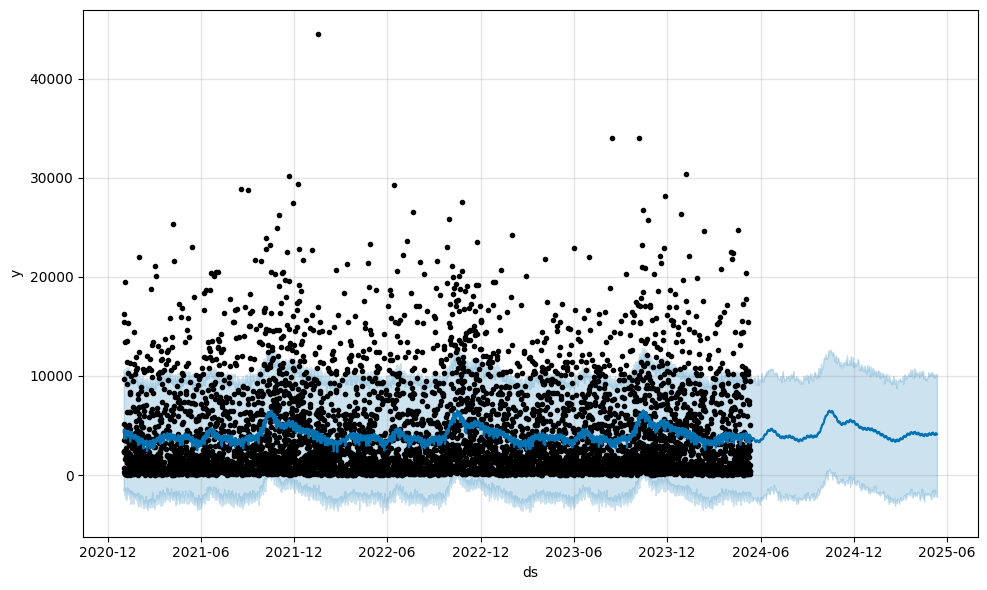

In [9]:
fig1 = m.plot(forecast)

/home/oscar/.local/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/home/oscar/.local/lib/python3.10/site-packages/prophet/plot.py:397: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  artists += ax.plot(df_y['ds'].dt.to_pydatetime(), seas[name], ls='-',
/home/oscar/.local/lib/python3.10/site-packages/prophet/plot.py:401: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the o

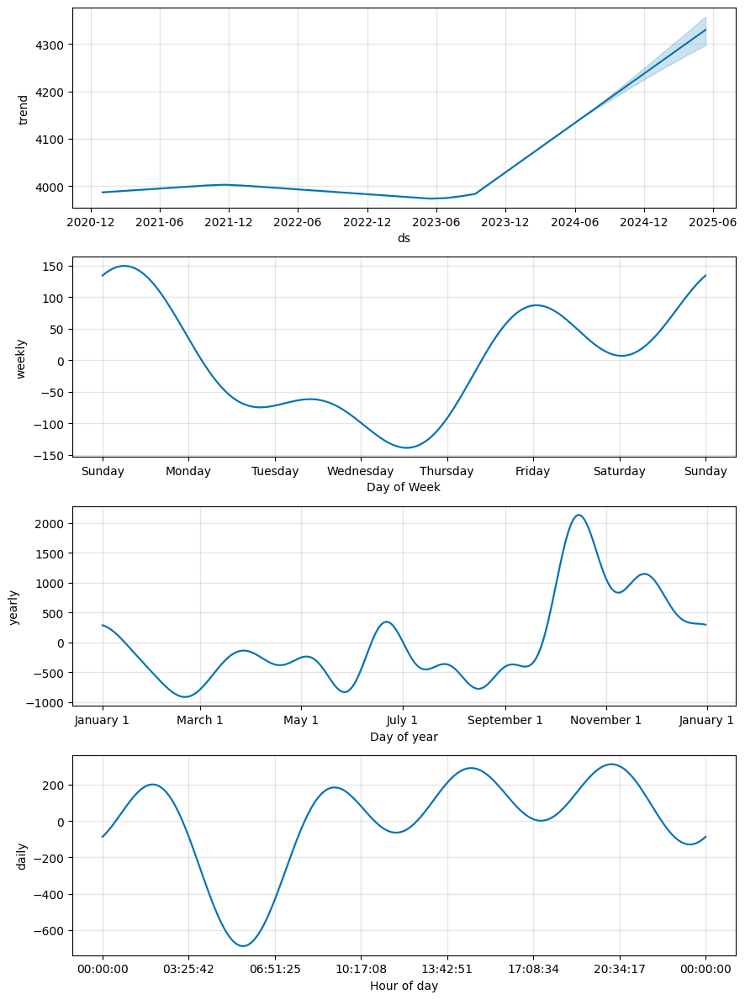

In [10]:
fig2 = m.plot_components(forecast)

In [11]:
fig1.savefig('../home/static/fig1.png')
fig2.savefig('../home/static/fig2.png')